<a href="https://colab.research.google.com/github/fadirockz/Collaborative-Sticky-Notes/blob/master/MyPorfolio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas
import yfinance as yf

In [ ]:
tickers = ['TSLA','AMZN','GOOGL']


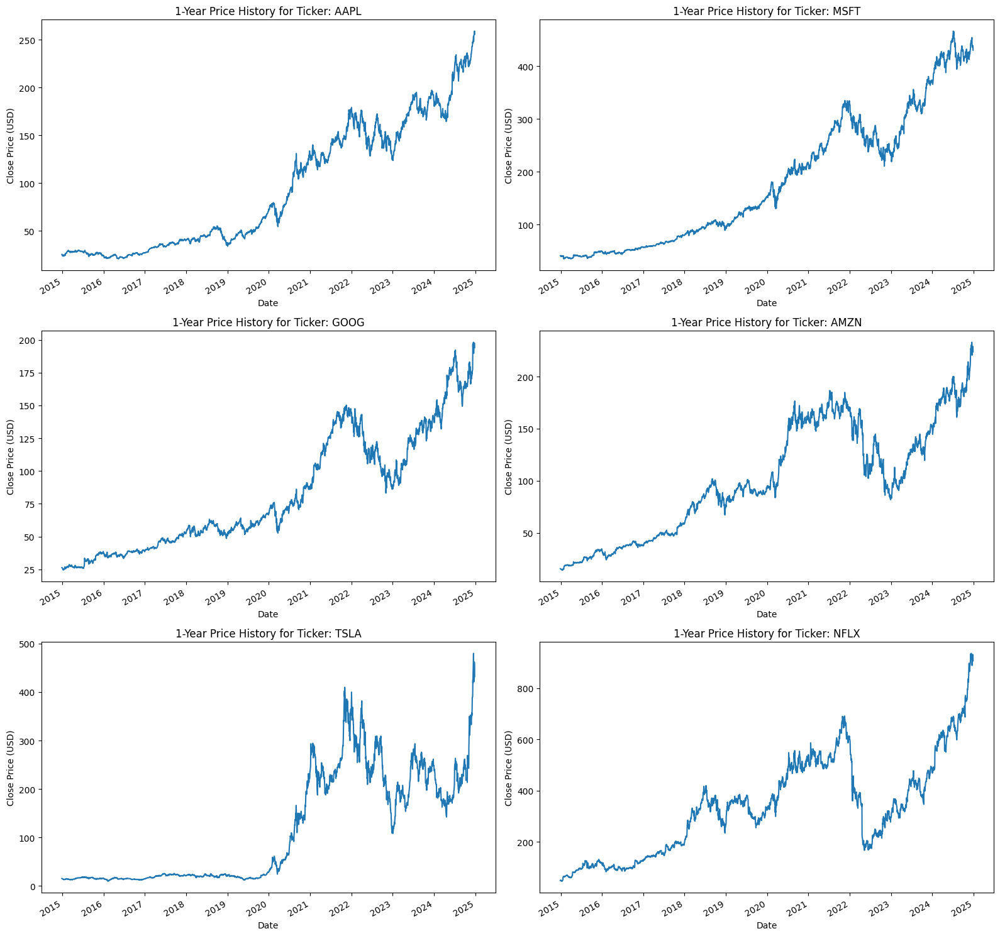

In [ ]:
import matplotlib.pyplot as plt
import yfinance as yf
import math

# Example list of tickers
tickers = ["AAPL", "MSFT", "GOOG", "AMZN", "TSLA", "NFLX"]

# Calculate the grid dimensions (rows and columns)
columns = 2
rows = math.ceil(len(tickers) / columns)

plt.figure(figsize=(16, rows * 5))  # Adjust height dynamically based on the number of rows

for i, ticker in enumerate(tickers):
    try:
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period='10Y')['Close']
        plt.subplot(rows, columns, i + 1)
        data.plot(title=f'1-Year Price History for Ticker: {ticker}')
        plt.ylabel('Close Price (USD)')
        plt.xlabel('Date')
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go
import yfinance as yf

# Example list of tickers
tickers = ["COST", "BTC", "CSU.TO", "DOL.TO","V"]

# Create a Plotly figure
fig = go.Figure()

for ticker in tickers:
    try:
        # Fetch stock data
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period='max')

        # Add trace for each stock
        fig.add_trace(
            go.Scatter(
                x=data.index,  # Dates
                y=data['Close'],  # Closing prices
                mode='lines',
                name=ticker,
                hovertemplate=(
                    f'<b>{ticker}</b><br>'
                    'Date: %{x|%Y-%m-%d}<br>'
                    'Close Price: $%{y:.2f}<extra></extra>'
                ),
            )
        )
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

# Customize the layout
fig.update_layout(
    title="10-Year Stock Price History",
    xaxis_title="Date",
    yaxis_title="Close Price (USD)",
    template="plotly_white",
    height=600,
)

# Show the interactive plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import yfinance as yf

# Example list of tickers
tickers = ["AAPL", "MSFT", "GOOG"]

# Fetch data for all tickers for the maximum period
data_dict = {}
for ticker in tickers:
    try:
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period="max")
        data_dict[ticker] = data
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

# Create a Plotly figure
fig = go.Figure()

# Add traces for each ticker
for ticker, data in data_dict.items():
    fig.add_trace(
        go.Scatter(
            x=data.index,
            y=data["Close"],
            mode="lines",
            name=ticker,
            visible=False,  # Initially hidden
        )
    )

# Default visibility for the "1 Year" period
for i, ticker in enumerate(tickers):
    if ticker in data_dict:
        data = data_dict[ticker]
        fig.data[i].x = data.index[-365:]  # Last 1 year
        fig.data[i].y = data["Close"].iloc[-365:]
        fig.data[i].visible = True

# Add buttons for different periods
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "label": "1 Month",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-30:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-30:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "3 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-90:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-90:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "6 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-180:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-180:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "1 Year",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-365:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-365:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "Max",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index for ticker in tickers],
                         "y": [data_dict[ticker]["Close"] for ticker in tickers]},
                    ],
                },
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)

# Customize the layout
fig.update_layout(
    title="Stock Price History with Period Selection",
    xaxis_title="Date",
    yaxis_title="Close Price (USD)",
    template="plotly_white",
    height=600,
)

# Show the interactive plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import yfinance as yf
from datetime import timedelta

# Example list of tickers
tickers = ["V", "DOL.TO", "COST","BTC-USD"]

# Fetch data for all tickers for the maximum period
data_dict = {}
for ticker in tickers:
    try:
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period="max")
        data_dict[ticker] = data
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

# Create a Plotly figure
fig = go.Figure()

# Add traces for each ticker
for ticker, data in data_dict.items():
    fig.add_trace(
        go.Scatter(
            x=data.index,
            y=data["Close"],
            mode="lines",
            name=ticker,
            visible=False,  # Initially hidden
        )
    )

# Helper function to filter data for the given years
def get_data_for_years(data, years):
    end_date = data.index[-1]
    start_date = end_date - timedelta(days=365 * years)
    return data[start_date:end_date]

# Default visibility for the "1 Year" period
for i, ticker in enumerate(tickers):
    if ticker in data_dict:
        data = data_dict[ticker]
        fig.data[i].x = data.index[-365:]  # Last 1 year
        fig.data[i].y = data["Close"].iloc[-365:]
        fig.data[i].visible = True

# Add buttons for different periods
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "label": "1 Month",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-30:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-30:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "3 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-90:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-90:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "6 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-180:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-180:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "1 Year",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-365:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-365:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "5 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 5).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 5)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "10 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 10).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 10)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "15 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 15).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 15)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "20 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 20).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 20)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "Max",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index for ticker in tickers],
                         "y": [data_dict[ticker]["Close"] for ticker in tickers]},
                    ],
                },
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)

# Customize the layout
fig.update_layout(
    title="Stock Price History with Period Selection",
    xaxis_title="Date",
    yaxis_title="Close Price (USD)",
    template="plotly_white",
    height=600,
)

# Show the interactive plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import yfinance as yf
from datetime import timedelta

# Example list of tickers
tickers = ["V", "DOL.TO", "COST","BTC-USD"]

# Fetch data for all tickers for the maximum period
data_dict = {}
for ticker in tickers:
    try:
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period="max")
        data_dict[ticker] = data
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

# Create a Plotly figure
fig = go.Figure()

# Add traces for each ticker
for ticker, data in data_dict.items():
    fig.add_trace(
        go.Scatter(
            x=data.index,
            y=data["Close"],
            mode="lines",
            name=ticker,  # Name appears in legend
        )
    )

# Helper function to filter data for the given years
def get_data_for_years(data, years):
    end_date = data.index[-1]
    start_date = end_date - timedelta(days=365 * years)
    return data[start_date:end_date]

# Add buttons for different periods
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "label": "1 Month",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-30:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-30:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "3 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-90:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-90:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "6 Months",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-180:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-180:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "1 Year",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index[-365:] for ticker in tickers],
                         "y": [data_dict[ticker]["Close"].iloc[-365:] for ticker in tickers]},
                    ],
                },
                {
                    "label": "5 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 5).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 5)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "10 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 10).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 10)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "15 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 15).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 15)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "20 Years",
                    "method": "update",
                    "args": [
                        {"x": [get_data_for_years(data_dict[ticker], 20).index for ticker in tickers],
                         "y": [get_data_for_years(data_dict[ticker], 20)["Close"] for ticker in tickers]},
                    ],
                },
                {
                    "label": "Max",
                    "method": "update",
                    "args": [
                        {"x": [data_dict[ticker].index for ticker in tickers],
                         "y": [data_dict[ticker]["Close"] for ticker in tickers]},
                    ],
                },
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)

# Enable legend toggling and automatic rescaling
fig.update_layout(
    title="Stock Price History with Period Selection",
    xaxis_title="Date",
    yaxis_title="Close Price (USD)",
    template="plotly_white",
    height=600,
    showlegend=True,  # Legend is visible
    legend=dict(      # Place legend on the right
        title="Tickers",
        x=1.05,
        y=1,
        traceorder="normal",
    ),
)

# Show the interactive plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import yfinance as yf
from datetime import timedelta

# Example list of tickers
tickers = ["AAPL", "MSFT", "GOOG"]

# Fetch data for all tickers for the maximum period
data_dict = {}
for ticker in tickers:
    try:
        current_ticker = yf.Ticker(ticker)
        data = current_ticker.history(period="max")
        data_dict[ticker] = data
    except Exception as e:
        print(f"Could not retrieve data for {ticker}: {e}")

# Create a Plotly figure
fig = go.Figure()

# Add traces for each ticker
for ticker, data in data_dict.items():
    fig.add_trace(
        go.Scatter(
            x=data.index,
            y=data["Close"],
            mode="lines",
            name=ticker,  # Name appears in legend
        )
    )

# Helper function to filter data for the given years
def get_data_for_years(data, years):
    end_date = data.index[-1]
    start_date = end_date - timedelta(days=365 * years)
    return data[start_date:end_date]

# Add buttons for different periods and scale toggling
fig.update_layout(
    updatemenus=[
        # Period Selection Buttons
        {
            "buttons": [
                {"label": "1 Month", "method": "update",
                 "args": [{"x": [data_dict[ticker].index[-30:] for ticker in tickers],
                           "y": [data_dict[ticker]["Close"].iloc[-30:] for ticker in tickers]}]},
                {"label": "3 Months", "method": "update",
                 "args": [{"x": [data_dict[ticker].index[-90:] for ticker in tickers],
                           "y": [data_dict[ticker]["Close"].iloc[-90:] for ticker in tickers]}]},
                {"label": "6 Months", "method": "update",
                 "args": [{"x": [data_dict[ticker].index[-180:] for ticker in tickers],
                           "y": [data_dict[ticker]["Close"].iloc[-180:] for ticker in tickers]}]},
                {"label": "1 Year", "method": "update",
                 "args": [{"x": [data_dict[ticker].index[-365:] for ticker in tickers],
                           "y": [data_dict[ticker]["Close"].iloc[-365:] for ticker in tickers]}]},
                {"label": "5 Years", "method": "update",
                 "args": [{"x": [get_data_for_years(data_dict[ticker], 5).index for ticker in tickers],
                           "y": [get_data_for_years(data_dict[ticker], 5)["Close"] for ticker in tickers]}]},
                {"label": "10 Years", "method": "update",
                 "args": [{"x": [get_data_for_years(data_dict[ticker], 10).index for ticker in tickers],
                           "y": [get_data_for_years(data_dict[ticker], 10)["Close"] for ticker in tickers]}]},
                {"label": "15 Years", "method": "update",
                 "args": [{"x": [get_data_for_years(data_dict[ticker], 15).index for ticker in tickers],
                           "y": [get_data_for_years(data_dict[ticker], 15)["Close"] for ticker in tickers]}]},
                {"label": "20 Years", "method": "update",
                 "args": [{"x": [get_data_for_years(data_dict[ticker], 20).index for ticker in tickers],
                           "y": [get_data_for_years(data_dict[ticker], 20)["Close"] for ticker in tickers]}]},
                {"label": "Max", "method": "update",
                 "args": [{"x": [data_dict[ticker].index for ticker in tickers],
                           "y": [data_dict[ticker]["Close"] for ticker in tickers]}]},
            ],
            "direction": "down",
            "showactive": True,
            "x": 0.1,
            "y": 1.15,
        },
        # Scale Toggle Buttons
        {
            "buttons": [
                {"label": "Linear Scale", "method": "relayout",
                 "args": [{"yaxis.type": "linear"}]},
                {"label": "Logarithmic Scale", "method": "relayout",
                 "args": [{"yaxis.type": "log"}]},
            ],
            "direction": "down",
            "showactive": True,
            "x": 0.3,
            "y": 1.15,
        }
    ]
)

# Enable legend toggling and automatic rescaling
fig.update_layout(
    title="Stock Price History with Period and Scale Options",
    xaxis_title="Date",
    yaxis_title="Close Price (USD)",
    template="plotly_white",
    height=600,
    showlegend=True,  # Legend is visible
    legend=dict(      # Place legend on the right
        title="Tickers",
        x=1.05,
        y=1,
        traceorder="normal",
    ),
)

# Show the interactive plot
fig.show()
